In [1]:
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import seaborn as sns
import pandas as pd
from PIL import Image
from copy import deepcopy
import cv2
from datetime import datetime
import time
%matplotlib inline

In [2]:
csv_folder = r"C:\Users\admin\Downloads\csv"
out_path = r"C:\Users\admin\Downloads\out"
video_path = r"C:\Users\admin\Downloads\accss_videos_elena\accss_videos_elena"
folder = f'{datetime.now().strftime("%Y_%m_%d-%I_%M_%S_%p")}'
output_path = f"C:\\Users\\admin\\Downloads\\image_plot\\{folder}"

if not os.path.exists(output_path):
    os.makedirs(output_path)

In [3]:
frame_selection = {
    'video-3-segment-2': [0, 1, 2, 3, 4, 5, 6], 
}

In [4]:
csv_files = sorted(glob.glob(
    os.path.join(
        csv_folder,
        '*.csv'
    )
))

In [5]:
# dash_type = {
#     'gt similarity': 'solid', 
#     'VQA similarity': 'dot', 
#     'resnet-50 feature similarity': 'dash',
#     'resnet-152 feature similarity': 'longdash', 
#     'alexnet feature similarity': 'dashdot',
#     'vgg16-bn feature similarity': 'longdashdot', 
#     'ssim similarity': '5, 10, 2, 2'
# }

#     d_types = []
#     for lbl in df2['Label']:
#         d_t = dash_type[lbl]
#         d_types.append(d_t)

#     df2['dash_type'] = d_types

In [6]:
fig1 = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])
fig1.write_image(os.path.join(output_path, ".garbage.pdf"))

In [7]:
time.sleep(10)

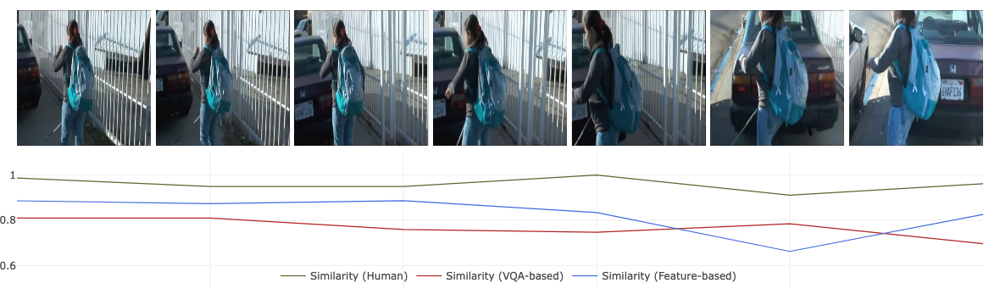

In [30]:
show_line = ["Similarity (Human)", "Similarity (VQA-based)", "Similarity (Feature-based)"]
select_line = [
    "Similarity (Human)", "Similarity (VQA-based)", "Similarity (Feature-based)"
]
color_v = ['darkolivegreen', 'firebrick', 'royalblue']
dash_type = ['solid', 'solid', 'solid']

for csv_file in csv_files:
    vid = csv_file.split('-')[1]
    seg = csv_file.split('-')[-1].split('.')[0]
    
    vid_sub_path = f"video_{vid.zfill(3)}/trimmed_video/keyframes_video_accss_{vid.zfill(3)}_elena_seg{seg.zfill(2)}.mp4"
    
    frame_selectors = frame_selection[os.path.basename(csv_file).split('.')[0]]
    
    master_image = None
    for c, selection in enumerate(frame_selectors):
        image_name = f"video_accss_{vid.zfill(3)}_elena_seg{seg.zfill(2)}_{selection}.jpeg"
        img_path = os.path.join(
            video_path,
            vid_sub_path,
            image_name
        )
        image = np.array(Image.open(img_path).convert('RGB'))
        h,w,_ = image.shape
        image = image[50:h-50, 100:w-100]  
        pad = np.ones((image.shape[0], 38, 3))*255 
        if master_image is None:
            master_image = deepcopy(image)
        else:
            master_image = np.concatenate([master_image, pad, image], axis=1)
            
    # aspect_rat = master_image.shape[1] / master_image.shape[0]
    master_image = Image.fromarray(master_image.astype(np.uint8))
    # master_image.save('tmp.jpeg')
    # fig_img = px.imshow(master_image, height=230, width=1200)
    # fig_img.update_xaxes(showticklabels=False)
    # fig_img.update_yaxes(showticklabels=False)
    # fig_img.show()
    
    df = pd.read_csv(csv_file, index_col = [1])

    drp_row = []
    for d_c in range(frame_selectors[-1], len(df.index)):
        drp_row.append(str(df.index[d_c]))
    df = df.drop(index=drp_row)
    df['frame pair'] = df.index
    
    df2 = pd.melt(
        df, id_vars=['frame pair'],
        var_name = 'Label',
        value_vars = select_line,
        value_name = 'Value'
    )
    df2.set_index(['frame pair'], inplace=True)
    df2['frame pair'] = df2.index
    # df2['color'] = df2.index
    # df2['dash_type'] = df2.index
    
    # for i, row in enumerate(df2.index):
    #     print(df2.iloc[i]['Label'])
    #     df2.iat[i, -2] = color_v[df2.iloc[i]['Label']]
    #     df2.iat[i, -1] = dash_type[df2.iloc[i]['Label']]
    
    df2.to_csv(
        os.path.join(
            out_path,
            os.path.basename(csv_file)
        )
    )

    fig = px.line(
        data_frame = df2,
        height=300,
        width=1200,
        x='frame pair',
        y='Value',
        color_discrete_sequence=color_v,
        line_dash='Label',
        line_dash_sequence=dash_type,
        color='Label',
        #title=f'Similarity between two frames({os.path.basename(csv_file).split(".")[0]})',
        template="gridon",
        range_y=(0.5, 1.1)
    ).update_traces(
        visible="legendonly", 
        selector=lambda t: not t.name in show_line,
    )
    
    fig.update_traces(
        line=dict(width=1.2)
    )
    

    fig.add_layout_image(
        dict(
            source=master_image,
            xref="paper", yref="paper",
            x=1, y=1.05,
            sizex=1, sizey=1,
            xanchor="right", yanchor="bottom",
            sizing="stretch",
        )
    )
    
    fig.update_layout(
        margin=dict(l=20, r=20, t=180, b=20),
        yaxis_title=None,
        xaxis_title=None,
        xaxis= dict(
            showticklabels= False
        )
    )
    
    fig.update_layout(legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0,
        xanchor="right",
        x=0.75,
        bgcolor='rgba(0,0,0,0)',
        title=None
    ))
    
    fig.write_image(
        os.path.join(output_path, f"{os.path.basename(csv_file).split('.')[0]}.pdf"), 
        format='pdf'
    )
    
    fig.show()
    